#  Predictive Maintenance for Utility Networks

## **AI4I 2020 Predictive Maintenance Dataset:**
Description: A synthetic dataset designed to reflect real-world predictive maintenance scenarios in the industry. It includes features such as machine age, type, operational settings, and failure occurrences.

**Import all required libraries**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, RobustScaler

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt

import seaborn as sns

In [56]:
# Load the dataset  
df = pd.read_csv(r"C:\Users\Chitti\Desktop\ai4i2020.csv")  

# Display the first 5 rows  
df.head()


,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0


In [57]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   UDI                      10000 non-null  int64  
 1   Product ID               10000 non-null  object 
 2   Type                     10000 non-null  object 
 3   Air temperature [K]      10000 non-null  float64
 4   Process temperature [K]  10000 non-null  float64
 5   Rotational speed [rpm]   10000 non-null  int64  
 6   Torque [Nm]              10000 non-null  float64
 7   Tool wear [min]          10000 non-null  int64  
 8   Machine failure          10000 non-null  int64  
 9   TWF                      10000 non-null  int64  
 10  HDF                      10000 non-null  int64  
 11  PWF                      10000 non-null  int64  
 12  OSF                      10000 non-null  int64  
 13  RNF                      10000 non-null  int64  
dtypes: float64(3), int64(9)

In [58]:
df.isnull().sum()

UDI                        0
Product ID                 0
Type                       0
Air temperature [K]        0
Process temperature [K]    0
Rotational speed [rpm]     0
Torque [Nm]                0
Tool wear [min]            0
Machine failure            0
TWF                        0
HDF                        0
PWF                        0
OSF                        0
RNF                        0
dtype: int64

In [59]:
df.describe()

,UDI,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
count,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000
mean,5000.50000,300.004930,310.005560,1538.776100,39.986910,107.951000,0.033900,0.004600,0.011500,0.009500,0.009800,0.00190
std,2886.89568,2.000259,1.483734,179.284096,9.968934,63.654147,0.180981,0.067671,0.106625,0.097009,0.098514,0.04355
min,1.00000,295.300000,305.700000,1168.000000,3.800000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
25%,2500.75000,298.300000,308.800000,1423.000000,33.200000,53.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
50%,5000.50000,300.100000,310.100000,1503.000000,40.100000,108.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
75%,7500.25000,301.500000,311.100000,1612.000000,46.800000,162.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
max,10000.00000,304.500000,313.800000,2886.000000,76.600000,253.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000


**Feature Engineering:** Create relevant features that could enhance the predictive power of the model. This may include time-based features, environmental factors, or operational settings.

In [60]:
# Check dataset shape (rows, columns)
print(f"Dataset contains {df.shape[0]} rows and {df.shape[1]} columns.")

# Display column names and types
print("\nColumn Info:")
print(df.info())

# Check for missing values
print("\nMissing Values in Each Column:")
print(df.isnull().sum())


Dataset contains 10000 rows and 14 columns.

Column Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   UDI                      10000 non-null  int64  
 1   Product ID               10000 non-null  object 
 2   Type                     10000 non-null  object 
 3   Air temperature [K]      10000 non-null  float64
 4   Process temperature [K]  10000 non-null  float64
 5   Rotational speed [rpm]   10000 non-null  int64  
 6   Torque [Nm]              10000 non-null  float64
 7   Tool wear [min]          10000 non-null  int64  
 8   Machine failure          10000 non-null  int64  
 9   TWF                      10000 non-null  int64  
 10  HDF                      10000 non-null  int64  
 11  PWF                      10000 non-null  int64  
 12  OSF                      10000 non-null  int64  
 13  RNF                

In [61]:
# Drop unnecessary columns
df = df.drop(["UDI", "Product ID"], axis=1)

# One-Hot Encoding for 'Type' (L, M, H)
df = pd.get_dummies(df, columns=["Type"], drop_first=True)  # Avoid dummy variable trap

# Separate features & target variable
X = df.drop(["Machine failure"], axis=1)  # Features
y = df["Machine failure"]  # Target

# Scale numerical features using RobustScaler (handles outliers)
scaler = RobustScaler()
X_scaled = scaler.fit_transform(X)

# Train-Test Split (80% Train, 20% Test)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42, stratify=y)

print("Data Preprocessing Completed!")


Data Preprocessing Completed!


In [62]:
np.sum(y_train)+np.sum(y_test)

339

**Random Forest Classifier**

In [48]:
# Train a Random Forest Model
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Predictions
y_pred = model.predict(X_test)

# Model Evaluation
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))


Accuracy: 0.999

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1932
           1       1.00      0.97      0.99        68

    accuracy                           1.00      2000
   macro avg       1.00      0.99      0.99      2000
weighted avg       1.00      1.00      1.00      2000


Confusion Matrix:
 [[1932    0]
 [   2   66]]


**Neural Network**

Epoch 1/50
250/250 [==============================] - 1s 2ms/step - loss: 0.2056 - accuracy: 0.9615 - val_loss: 0.0667 - val_accuracy: 0.9750
Epoch 2/50
250/250 [==============================] - 0s 1ms/step - loss: 0.0261 - accuracy: 0.9948 - val_loss: 0.0111 - val_accuracy: 0.9985
Epoch 3/50
250/250 [==============================] - 0s 1ms/step - loss: 0.0090 - accuracy: 0.9990 - val_loss: 0.0087 - val_accuracy: 0.9990
Epoch 4/50
250/250 [==============================] - 0s 1ms/step - loss: 0.0076 - accuracy: 0.9991 - val_loss: 0.0087 - val_accuracy: 0.9990
Epoch 5/50
250/250 [==============================] - 0s 1ms/step - loss: 0.0071 - accuracy: 0.9991 - val_loss: 0.0095 - val_accuracy: 0.9990
Epoch 6/50
250/250 [==============================] - 0s 1ms/step - loss: 0.0070 - accuracy: 0.9991 - val_loss: 0.0090 - val_accuracy: 0.9990
Epoch 7/50
250/250 [==============================] - 0s 1ms/step - loss: 0.0068 - accuracy: 0.9991 - val_loss: 0.0092 - val_accuracy: 0.9990
Epoch 

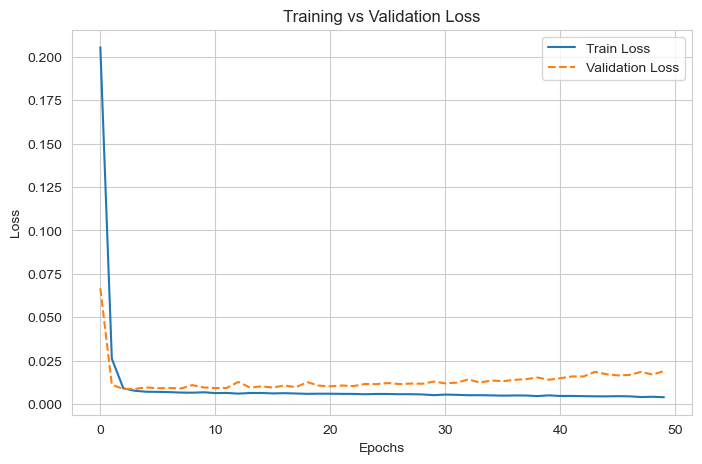


✅ Test Accuracy: 0.9985


In [21]:
# Define the neural network model
model = keras.Sequential([
    keras.layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)),  # First hidden layer
    keras.layers.Dense(32, activation='relu'),  # Second hidden layer
    keras.layers.Dense(1, activation='sigmoid')  # Output layer (binary classification)
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model and track history
history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=50, batch_size=32, verbose=1)

# Plot training vs validation loss
plt.figure(figsize=(8,5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss', linestyle='dashed')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()
plt.show()

# Evaluate model on test set
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)
print(f"\n✅ Test Accuracy: {test_acc:.4f}")


In [47]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                832       
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 2945 (11.50 KB)
Trainable params: 2945 (11.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


**Evaluation**

63/63 [==============================] - 0s 614us/step

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1932
           1       1.00      0.96      0.98        68

    accuracy                           1.00      2000
   macro avg       1.00      0.98      0.99      2000
weighted avg       1.00      1.00      1.00      2000



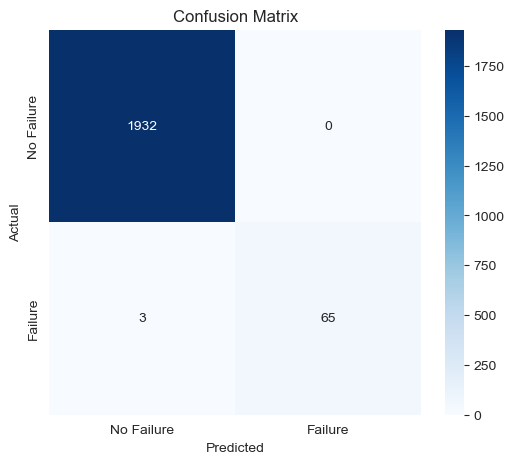

In [22]:
# Predict class probabilities
y_pred_probs = model.predict(X_test)
y_pred = (y_pred_probs > 0.5).astype(int)  # Convert probabilities to binary labels

# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Print classification report
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Plot confusion matrix
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["No Failure", "Failure"], yticklabels=["No Failure", "Failure"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()


In [52]:
# Load data
df = pd.read_csv(r"C:\Users\Chitti\Desktop\ai4i2020.csv")  

# One-Hot Encoding for 'Type' (L, M, H)
df = pd.get_dummies(df, columns=["Type"], drop_first=True)  

# Simulate random GPS coordinates (replace with real location data if available)
np.random.seed(42)
df['latitude'] = np.random.uniform(40.5, 40.8, df.shape[0])   # Example: New York City area
df['longitude'] = np.random.uniform(-74.1, -73.7, df.shape[0])

# Define feature columns by removing non-numeric and target columns
feature_columns = X.columns

# Ensure feature columns match model input
df['failure_risk'] = model.predict(X_scaled)

# Convert probabilities to binary classification (0 or 1)
df['failure_risk'] = (df['failure_risk'] > 0.5).astype(int)

# Convert to labels
df['risk_label'] = df['failure_risk'].apply(lambda x: "High Risk" if x == 1 else "Low Risk")


print(df[['latitude', 'longitude', 'risk_label']])


313/313 [==============================] - 0s 566us/step
       latitude  longitude risk_label
0     40.612362 -73.950544   Low Risk
1     40.785214 -73.966835   Low Risk
2     40.719598 -74.029538   Low Risk
3     40.679598 -73.857093   Low Risk
4     40.546806 -73.909350   Low Risk
...         ...        ...        ...
9995  40.757297 -73.749185   Low Risk
9996  40.769253 -74.081274   Low Risk
9997  40.784012 -73.978521   Low Risk
9998  40.619246 -73.922672   Low Risk
9999  40.565142 -74.031094   Low Risk

[10000 rows x 3 columns]


# Map high risk and low risk areas on the Map using Folium

In [33]:
!pip install folium

     -------------------------------------- 110.5/110.5 kB 2.1 MB/s eta 0:00:00
     ---------------------------------------- 88.4/88.4 kB 5.2 MB/s eta 0:00:00


In [53]:
import folium

# Define a map centered at a chosen location
m = folium.Map(location=[40.7, -74.0], zoom_start=12)  

# Add machine locations to the map
for _, row in df.iterrows():
    color = "black" if row["risk_label"] == "High Risk" else "white"
    folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=5,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.6,
        popup=f"Machine ID: {row.name}, Risk: {row['risk_label']}"
    ).add_to(m)

m  # Displays the interactive map


In [54]:
# Count occurrences of each risk level
risk_counts = df['risk_label'].value_counts()

# Print results
print("Machine Failure Risk Distribution:")
print(risk_counts)


Machine Failure Risk Distribution:
Low Risk     9671
High Risk     329
Name: risk_label, dtype: int64
